# Model A Data Quality Check

`modelA_Data_preprocessing.ipynb`에서 Lane Ordering 결과를 실제 이미지에 시각화한 뒤, 일부 이미지가 일반적인 차량 전방 고정형 블랙박스 시점과 크게 다른 것을 확인하였다.

본 Notebook의 목적은 **Model A가 실제로 사용할 전방 고정형 블랙박스 입력 도메인과 시점이 충분히 유사한지를 확인하는 것**이다.

## Import

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

print("NumPy :", np.__version__)
print("Pandas:", pd.__version__)

NumPy : 2.4.6
Pandas: 3.0.5


## 경로 설정

현재 로컬 작업공간은 `C:/accident_ai`이며, 대용량 원본 데이터와 중간 산출물은 Git Repository 바깥의 `lane_data`, `outputs`에서 관리한다.

이번 Notebook은 `modelA_Data_preprocessing.ipynb`가 생성한 두 JSONL 파일을 입력으로 사용한다.

In [2]:
# 전체 로컬 작업공간
WORKSPACE_ROOT = Path(r"C:\accident_ai")

# 원본 이미지
IMAGE_ROOT = (
    WORKSPACE_ROOT
    / "lane_data"
    / "Training"
    / "image"
)

# 이전 Data Preprocessing Notebook에서 전달받는 입력
QUALITY_CHECK_INPUT_ROOT = (
    WORKSPACE_ROOT
    / "outputs"
    / "modelA_Data_Quality_check_inputs"
)

# 이번 Quality Check Notebook 자체 결과 저장 위치
QUALITY_CHECK_OUTPUT_ROOT = (
    WORKSPACE_ROOT
    / "outputs"
    / "modelA_Data_Quality_check_outputs"
)

QUALITY_CHECK_OUTPUT_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

IMAGE_MANIFEST_PATH = (
    QUALITY_CHECK_INPUT_ROOT
    / "modelA_image_manifest.jsonl"
)

LANE_VECTOR_ORDERED_PATH = (
    QUALITY_CHECK_INPUT_ROOT
    / "modelA_lane_vector_ordered.jsonl"
)


for path_name, path in {
    "IMAGE_ROOT": IMAGE_ROOT,
    "IMAGE_MANIFEST_PATH": IMAGE_MANIFEST_PATH,
    "LANE_VECTOR_ORDERED_PATH": LANE_VECTOR_ORDERED_PATH,
}.items():
    if not path.exists():
        raise FileNotFoundError(
            f"{path_name} 경로가 없습니다: {path}"
        )


print("IMAGE_ROOT:")
print(IMAGE_ROOT)
print()
print("QUALITY_CHECK_INPUT_ROOT:")
print(QUALITY_CHECK_INPUT_ROOT)
print()
print("QUALITY_CHECK_OUTPUT_ROOT:")
print(QUALITY_CHECK_OUTPUT_ROOT)

IMAGE_ROOT:
C:\accident_ai\lane_data\Training\image

QUALITY_CHECK_INPUT_ROOT:
C:\accident_ai\outputs\modelA_Data_Quality_check_inputs

QUALITY_CHECK_OUTPUT_ROOT:
C:\accident_ai\outputs\modelA_Data_Quality_check_outputs


## Data Preprocessing 결과 Load

In [3]:
df_image_manifest = pd.read_json(
    IMAGE_MANIFEST_PATH,
    lines=True
)

df_lane_vector_ordered = pd.read_json(
    LANE_VECTOR_ORDERED_PATH,
    lines=True
)


print("Image Manifest shape:", df_image_manifest.shape)
print(
    "Image Manifest 고유 이미지:",
    df_image_manifest["file_name"].nunique()
)

print()

print(
    "Ordered Lane Vector shape:",
    df_lane_vector_ordered.shape
)
print(
    "Ordered Lane Vector 고유 이미지:",
    df_lane_vector_ordered["file_name"].nunique()
)

print()
print("[Image Manifest sample]")
display(df_image_manifest.head(10))

print("[Ordered Lane Vector sample]")
display(df_lane_vector_ordered.head(10))

Image Manifest shape: (15000, 10)
Image Manifest 고유 이미지: 15000

Ordered Lane Vector shape: (74542, 13)
Ordered Lane Vector 고유 이미지: 14856

[Image Manifest sample]


,file_name,image_size,annotation_count,traffic_lane_count,stop_line_count,crosswalk_count,has_traffic_lane,has_stop_line,has_crosswalk,annotation_type
0,13883084.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
1,13883085.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
2,13883471.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
3,13883472.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
4,13883473.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
5,13883474.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
6,13883475.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
7,13883476.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
8,13883477.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane
9,13883478.jpg,"[1080, 1920]",8,8,0,0,True,False,False,lane


[Ordered Lane Vector sample]


,file_name,image_size,lane_id,lane_order,lane_color,lane_type,category,x_data,y_data,point_count,lane_order_x,lane_order_y,lane_order_method
0,13883084.jpg,"[1080, 1920]",0,0,white,solid,polyline,"[207, 206, 480, 832]","[724, 723, 663, 584]",4,604.759494,635,common_y
1,13883084.jpg,"[1080, 1920]",1,1,white,dotted,polyline,"[909, 809]","[591, 651]",2,835.666667,635,common_y
2,13883084.jpg,"[1080, 1920]",7,2,white,solid,polyline,"[1022, 1145, 1263]","[589, 684, 778]",3,1081.557895,635,common_y
3,13883084.jpg,"[1080, 1920]",6,3,white,solid,polyline,"[1021, 1129, 1311]","[582, 653, 772]",3,1101.619718,635,common_y
4,13883084.jpg,"[1080, 1920]",5,4,white,solid,polyline,"[1678, 1274, 1035]","[739, 630, 568]",3,1292.532110,635,common_y
5,13883084.jpg,"[1080, 1920]",4,5,white,solid,polyline,"[1031, 1270, 1560, 1709]","[565, 623, 696, 731]",4,1317.671233,635,common_y
6,13883084.jpg,"[1080, 1920]",2,6,white,dotted,polyline,"[1162, 1561]","[578, 635]",2,1561.000000,635,common_y
7,13883084.jpg,"[1080, 1920]",3,7,white,solid,polyline,"[1194, 1547, 1853, 1908]","[571, 607, 640, 649]",4,1806.636364,635,common_y
8,13883085.jpg,"[1080, 1920]",0,0,white,solid,polyline,"[265, 499, 842]","[716, 658, 584]",3,531.445946,651,common_y
9,13883085.jpg,"[1080, 1920]",1,1,white,dotted,polyline,"[905, 703]","[600, 723]",2,821.243902,651,common_y


## 1. Blackbox Section 경계 검증

AIHub 이미지들을 직접 확인한 결과, 각 이미지는 서로 독립된 이미지가 아니라
동일한 고정형 블랙박스 영상에서 추출된 연속 프레임으로 구성되어 있음을 확인하였다.

따라서 이미지 단위의 자동 Quality Filtering보다 먼저 동일한 블랙박스 영상에서
추출된 이미지들을 하나의 Section으로 구분한다.

현재는 수동 확인을 통해 Blackbox Section과 추가 확인이 필요한 Matter Section의
시작/끝 이미지 번호를 기록하였다.

파일 번호는 연속적으로 +1씩 증가하지 않으므로 번호 범위 자체의 크기를 세지 않고,
실제 Image Manifest에 존재하는 이미지가 각 Section에 정확히 한 번씩 포함되는지 검증한다.

In [4]:
# ============================================================
# 1. Blackbox / Matter Section 정의
# ============================================================

SECTIONS = [
    {
        "section_name": "blackbox_0",
        "section_type": "blackbox",
        "start_id": 13883084,
        "end_id": 13899612,
    },
    {
        "section_name": "matter_0",
        "section_type": "matter",
        "start_id": 13899673,
        "end_id": 13903748,
    },
    {
        "section_name": "blackbox_1",
        "section_type": "blackbox",
        "start_id": 13904066,
        "end_id": 13957550,
    },
    {
        "section_name": "matter_1",
        "section_type": "matter",
        "start_id": 14543450,
        "end_id": 14543728,
    },
    {
        "section_name": "blackbox_2",
        "section_type": "blackbox",
        "start_id": 14543733,
        "end_id": 14554062,
    },
    {
        "section_name": "matter_2",
        "section_type": "matter",
        "start_id": 14554890,
        "end_id": 14702920,
    },
    {
        "section_name": "blackbox_3",
        "section_type": "blackbox",
        "start_id": 14703057,
        "end_id": 14709519,
    },
    {
        "section_name": "matter_3",
        "section_type": "matter",
        "start_id": 14711701,
        "end_id": 14843933,
    },
    {
        "section_name": "blackbox_4",
        "section_type": "blackbox",
        "start_id": 14864896,
        "end_id": 14943060,
    },
    {
        "section_name": "matter_4",
        "section_type": "matter",
        "start_id": 15115066,
        "end_id": 15115066,
    },
]


df_section_check = df_image_manifest.copy()


# 13883084.jpg → 13883084
df_section_check["image_id"] = (
    df_section_check["file_name"]
    .apply(lambda file_name: int(Path(file_name).stem))
)


# 아직 어느 Section에도 배정되지 않은 상태
df_section_check["section_name"] = pd.NA
df_section_check["section_type"] = pd.NA


# 실제 존재하는 이미지에 대해서만 Section 할당
for section in SECTIONS:

    mask = (
        df_section_check["image_id"]
        .between(
            section["start_id"],
            section["end_id"]
        )
    )

    # 이미 다른 section에 할당된 이미지가 다시 잡히는지 확인
    overlap_mask = (
        mask
        & df_section_check["section_name"].notna()
    )

    if overlap_mask.any():
        raise ValueError(
            f"Section 범위가 겹칩니다: "
            f"{section['section_name']}"
        )

    df_section_check.loc[
        mask,
        "section_name"
    ] = section["section_name"]

    df_section_check.loc[
        mask,
        "section_type"
    ] = section["section_type"]


# ============================================================
# Coverage 확인
# ============================================================

total_count = len(df_section_check)

assigned_count = (
    df_section_check["section_name"]
    .notna()
    .sum()
)

unassigned_count = (
    df_section_check["section_name"]
    .isna()
    .sum()
)


print("전체 이미지 수:", total_count)
print("Section에 포함된 이미지 수:", assigned_count)
print("Section 미할당 이미지 수:", unassigned_count)

print()
print("[Section별 실제 이미지 수]")

display(
    df_section_check[
        "section_name"
    ]
    .value_counts(dropna=False)
    .rename("image_count")
    .to_frame()
)

전체 이미지 수: 15000
Section에 포함된 이미지 수: 15000
Section 미할당 이미지 수: 0

[Section별 실제 이미지 수]


,image_count
section_name,
blackbox_1,4987
matter_3,3385
blackbox_0,2670
blackbox_2,1683
matter_2,1540
blackbox_3,386
matter_0,282
matter_1,34
blackbox_4,32


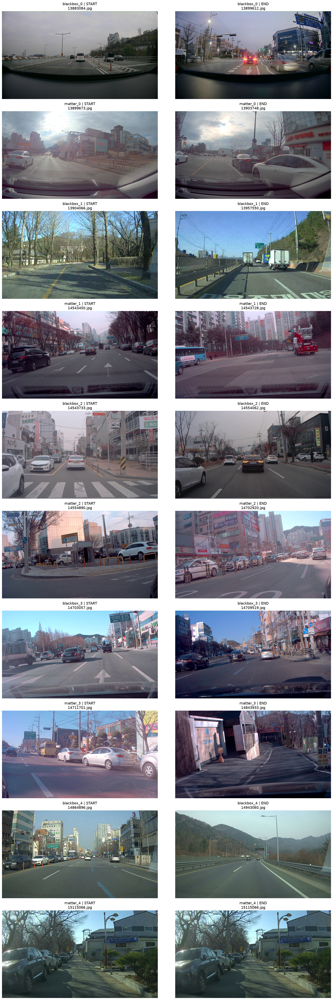

In [11]:
# ============================================================
# 2. Blackbox / Matter Section 경계값 시각화
# ============================================================

import matplotlib.pyplot as plt
from PIL import Image


# IMAGE_ROOT 하위의 실제 jpg 경로를 file_name 기준으로 연결
image_path_map = {
    path.name: path
    for path in IMAGE_ROOT.rglob("*.jpg")
}


# Section 하나 = 한 행
# 왼쪽: START / 오른쪽: END
fig, axes = plt.subplots(
    nrows=len(SECTIONS),
    ncols=2,
    figsize=(18, 5 * len(SECTIONS))
)


for row_idx, section in enumerate(SECTIONS):

    section_name = section["section_name"]

    start_file = f"{section['start_id']}.jpg"
    end_file = f"{section['end_id']}.jpg"

    boundary_files = [
        ("START", start_file),
        ("END", end_file)
    ]


    for col_idx, (boundary_name, file_name) in enumerate(boundary_files):

        ax = axes[row_idx, col_idx]

        image_path = image_path_map.get(file_name)

        if image_path is None:
            ax.text(
                0.5,
                0.5,
                f"이미지 없음\n{file_name}",
                ha="center",
                va="center",
                fontsize=14
            )

            ax.axis("off")
            continue


        image = Image.open(image_path)

        ax.imshow(image)

        ax.set_title(
            f"{section_name} | {boundary_name}\n{file_name}",
            fontsize=13
        )

        ax.axis("off")


plt.tight_layout()
plt.show()